# **Network Analysis Application**

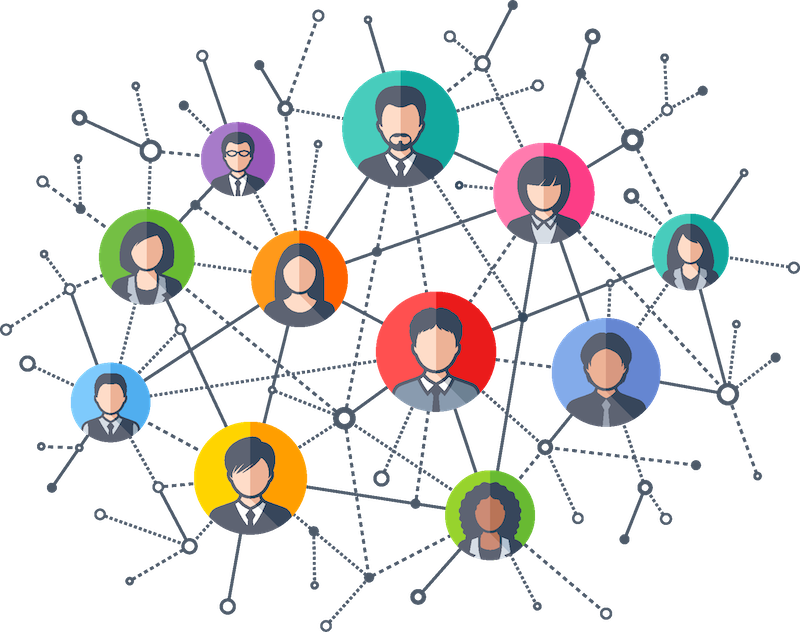

## Group members
* Benjamin Ly - 20205432
* Camilla Dyg Hannesbo - 20202923
* Laura Veng Larsen - 20231037
* Tobias Moesgård Jensen - 20231658

# Introduction

**What is networks in general:** <br>
Generally, networks is a form of representing **relational data**. This is a very general tool that can be applied to many different types of relationships between all kind of elements. The content, meaning, and interpretation for sure depends on what elements we display, and which types of relationships.

In this assigment we have a Social Network:
* Nodes represent twitter users
* Edges represent relationships between twitter users (friendship, interaction ect.)

This is based on the dataset: *Twitter Interaction Network for the US Congress.*

**Different types of networks:** <br>
*Undirected Network:*
* Edges without Direction: In an undirected network, edges do not have direction. They simply indicate a symmetric relationship or connection between two nodes without specifying a source or target.
* Bidirectional: Undirected edges represent a bidirectional relationship, meaning the relationship is mutual or reciprocal. The relations (edges) is symetric (`A->B == B->A`).

*Directed Network (Digraph):*
* Edges with Direction: In a directed network, edges (connections) have direction. They indicate that a relationship or interaction flows from one node to another.
* Arrowhead Representation: Directed edges are typically represented with arrowheads to indicate the direction of the relationship.

For instance, Facebook can be described with an undirected graph since the friendship is bidirectional, Alice and Bob being friends is the same as Bob and Alice being friends. On the other hand, Twitter can be described with a directed graph: Alice can follow Bob without Bob following Alice.

Therefore, in this assigment we have a directed network which is why we have to take this directionality into account.

## Importing libraries
At first we will install the python packages we are using in this notebook.
We make the --q commant after the name of the libraries since we would like to make the installation quiet.
Afterwards we will import all the necessary libraries as well.

In [1]:
# Pip-install the necessary packages

# These are usind for visualization purposes
!pip install -U --q bokeh
!pip install -U --q holoviews
!pip install -U --q datashader
!pip install -U --q pyvis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 36.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 69.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 56.4 MB/s eta 0:00:00


In [2]:
# Import the necessary libraries

# Basic libraries for data manipulation, numerical operations, visualization ect.
import pandas as pd # Import the pandas library for data manipulation and analysis
import numpy as np # Import the numpy library for numerical operations
import seaborn as sns # Import the seaborn library for data visualization based on Matplotlib
import matplotlib.pyplot as plt # Import the pyplot module from matplotlib for creating static plots
import plotly.graph_objects as go  # Import the graph_objects module from plotly for creating interative network plots

# For controlling warnings in the code
import warnings
from sklearn.exceptions import ConvergenceWarning

# Libraries for Network Analysis and Community Detection
import networkx as nx # Import the 'networkx' library for working with graphs and networks.
import community.community_louvain as community_louvain # Import the Louvain community detection algorithm from the 'community' module

# Creating interactive network visualizations and for the app
from pyvis.network import Network # Import the 'Network' class from the 'pyvis.network' module for interactive network visualizations
import pyvis # Import the 'pyvis' module for additional resources and utilities for working with Pyvis visualizations.

In [3]:
# We will call the below code to ignore all selected warnings in the code for getting more clearn outputs
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore", category=UserWarning)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
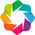

In [4]:
# Import the libraries and link to the bokeh backend
import holoviews as hv # Imports the 'holoviews' library for creating interactive visualizations
from holoviews import opts # opts module provides a way to set and customize options for visualizations
hv.extension('bokeh') # activates the Bokeh plotting backend for Holoviews.
from bokeh.plotting import show

# Setting the default figure size a bit larger
defaults = dict(width=750, height=750, padding=0.1,
                xaxis=None, yaxis=None)
hv.opts.defaults(
    opts.EdgePaths(**defaults), opts.Graph(**defaults), opts.Nodes(**defaults))

## Loading edgelist
This network represents the Twitter interaction network for the 117th United States Congress, both House of Representatives and Senate. The base data was collected via the Twitter's API, then the empirical transmission probabilities were quantified according to the fraction of times one member retweeted, quote tweeted, replied to, or mentioned another member's tweet. See the publication for more details.

In [5]:
# Define the filepath of the dataset
filepath_edgelist = 'congress.edgelist'

# Use networkx to read the dataset as a DiGraph since the network is a directed Network
data = nx.read_edgelist(filepath_edgelist, create_using = nx.DiGraph)

In [6]:
# Now we convert this edgelist to a pandas dataframe and show it with the .head() function
G_pandas = nx.to_pandas_edgelist(data)
G_pandas.head()

,source,target,weight
0,0,4,0.002105
1,0,12,0.002105
2,0,18,0.002105
3,0,25,0.004211
4,0,30,0.002105


In [7]:
# Convert the 'source' and 'target' column to integers
G_pandas['source'] = G_pandas['source'].astype(int)
G_pandas['target'] = G_pandas['target'].astype(int)

In [8]:
# As we can see 'source' and 'target' is now integers
G_pandas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13289 entries, 0 to 13288
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   source  13289 non-null  int64  
 1   target  13289 non-null  int64  
 2   weight  13289 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 311.6 KB


## Loading username
In the edge list, we only have source and target nodes, along with a weight. In order to identify individual users, we also import the `congress_network_data.json` file to map usernames to the respective sources. To do that, we import the file and create a pandas dataframe of usernames with ID as the index.

In [9]:
# Define the filepath of the dataset
filepath_username = 'congress_network_data.json'

# Use pandas to read the json-file as a pandas dataframe
username_data = pd.read_json(filepath_username)
username_data.head()

,inList,inWeight,outList,outWeight,usernameList
0,"[[4, 9, 11, 13, 18, 27, 29, 33, 38, 45, 46, 50...","[[0.0036496350364960003, 0.0036101083032490005...","[[4, 12, 18, 25, 30, 46, 55, 58, 59, 74, 76, 7...","[[0.002105263157894, 0.002105263157894, 0.0021...","[SenatorBaldwin, SenJohnBarrasso, SenatorBenne..."


In [10]:
# Define a function to extract the username list from a given record
def extract_username_list(record):
    return record

# Apply the 'extract_username_list' function to the 'usernameList' column and create a new column 'Extracted_Username_List'
username_data['Extracted_Username_List'] = username_data['usernameList'].apply(extract_username_list)

# Get the username list from the first record (assuming 'usernameList' is a list of usernames in the DataFrame)
username_list = username_data['usernameList'][0]

In [11]:
# Create a DataFrame from the list of usernames
usernames = pd.DataFrame({'username': username_list})

# Now you have a DataFrame with individual usernames as separate records
usernames.head()

,username
0,SenatorBaldwin
1,SenJohnBarrasso
2,SenatorBennet
3,MarshaBlackburn
4,SenBlumenthal


# Graph Creation
A graph is a data structure used to represent relationships between entities. It consists of nodes (vertices) and edges (connections) that link these nodes. In graph creation, we define nodes and edges to construct a visual or computational representation of these relationships, allowing us to analyze and understand complex connections in various domains.

To create a graph from a defined edgelist, we will use the graph library, NetworkX in Python.

In [12]:
# After we have made our edgelist to a pandas dataframe we make this to a DiGraph we can use nx.from_pandas_edgelist
G = nx.from_pandas_edgelist(G_pandas,
                            source='source',
                            target='target',
                            edge_attr='weight',
                            create_using = nx.DiGraph)

In [13]:
# Set 'username' as an attribute for each node
attributes = usernames.to_dict()['username']
nx.set_node_attributes(G, attributes, 'username')

In [14]:
# Printing nodes with corresponding attribute
print(nx.get_node_attributes(G, 'username'))

{0: 'SenatorBaldwin', 4: 'SenBlumenthal', 12: 'SenatorCardin', 18: 'SenCortezMasto', 25: 'SenatorDurbin', 30: 'LindseyGrahamSC', 46: 'SenAmyKlobuchar', 55: 'SenJeffMerkley', 58: 'ChrisMurphyCT', 59: 'PattyMurray', 74: 'SenatorShaheen', 76: 'SenTinaSmith', 77: 'SenStabenow', 85: 'MarkWarner', 86: 'SenatorWarnock', 87: 'SenWarren', 154: 'RepJudyChu', 168: 'RepJoeCourtney', 341: 'RepGwenMoore', 374: 'repmarkpocan', 401: 'janschakowsky', 3: 'MarshaBlackburn', 14: 'SenBobCasey', 17: 'JohnCornyn', 24: 'SenDuckworth', 27: 'SenFeinstein', 64: 'senrobportman', 79: 'SenatorTester', 84: 'ChrisVanHollen', 88: 'SenWhitehouse', 89: 'SenatorWicker', 149: 'JoaquinCastrotx', 179: 'rosadelauro', 197: 'RepDwightEvans', 213: 'RepGaramendi', 224: 'RepJenniffer', 243: 'RepJahanaHayes', 250: 'jahimes', 268: 'RepHankJohnson', 286: 'CongressmanRaja', 293: 'RepJohnLarson', 315: 'RepMaloney', 447: 'RepLoriTrahan', 460: 'RepDWStweets', 11: 'SenCapito', 13: 'SenatorCarper', 32: 'SenatorHagerty', 57: 'lisamurkowski

In [15]:
# Now we calculate the number of nodes and edges.
# This corresponds with the info that were giving.
print('#nodes:', len(G.nodes()), 'and', '#edges:', len(G.edges()))

#nodes: 475 and #edges: 13289


In [16]:
# This can also be done by a simple print of the Graph
print(G)

DiGraph with 475 nodes and 13289 edges


In [17]:
# Get a list of nodes in the graph 'G'
G.nodes()

NodeView((0, 4, 12, 18, 25, 30, 46, 55, 58, 59, 74, 76, 77, 85, 86, 87, 154, 168, 341, 374, 401, 3, 14, 17, 24, 27, 64, 79, 84, 88, 89, 149, 179, 197, 213, 224, 243, 250, 268, 286, 293, 315, 447, 460, 11, 13, 32, 57, 91, 126, 162, 254, 255, 327, 334, 392, 398, 448, 454, 470, 2, 9, 28, 42, 50, 54, 68, 110, 217, 229, 299, 442, 48, 53, 61, 71, 75, 80, 111, 123, 136, 147, 193, 205, 215, 247, 278, 387, 393, 403, 450, 452, 21, 47, 70, 72, 138, 160, 161, 190, 234, 246, 260, 306, 335, 389, 415, 422, 428, 20, 26, 36, 38, 130, 139, 201, 207, 251, 325, 349, 358, 367, 371, 423, 5, 90, 92, 119, 122, 135, 155, 165, 177, 256, 424, 465, 467, 6, 15, 35, 60, 81, 82, 148, 183, 375, 381, 411, 416, 437, 439, 8, 10, 37, 180, 262, 263, 281, 292, 351, 368, 376, 405, 433, 33, 65, 287, 329, 364, 23, 66, 117, 137, 266, 336, 400, 444, 466, 7, 51, 63, 188, 280, 296, 431, 443, 43, 73, 214, 311, 326, 408, 421, 121, 143, 169, 259, 410, 96, 105, 156, 157, 171, 174, 222, 270, 279, 303, 318, 365, 438, 461, 463, 142, 176

In [18]:
# Get a list of edges in the graph 'G'
G.edges()

OutEdgeView([(0, 4), (0, 12), (0, 18), (0, 25), (0, 30), (0, 46), (0, 55), (0, 58), (0, 59), (0, 74), (0, 76), (0, 77), (0, 85), (0, 86), (0, 87), (0, 154), (0, 168), (0, 341), (0, 374), (0, 401), (4, 0), (4, 3), (4, 12), (4, 14), (4, 17), (4, 24), (4, 25), (4, 27), (4, 30), (4, 46), (4, 55), (4, 58), (4, 59), (4, 64), (4, 79), (4, 84), (4, 88), (4, 89), (4, 149), (4, 154), (4, 168), (4, 179), (4, 197), (4, 213), (4, 224), (4, 243), (4, 250), (4, 268), (4, 286), (4, 293), (4, 315), (4, 374), (4, 401), (4, 447), (4, 460), (12, 11), (12, 13), (12, 17), (12, 30), (12, 32), (12, 46), (12, 55), (12, 57), (12, 59), (12, 64), (12, 74), (12, 84), (12, 89), (12, 91), (12, 126), (12, 162), (12, 254), (12, 255), (12, 327), (12, 334), (12, 392), (12, 398), (12, 448), (12, 454), (12, 470), (18, 0), (18, 2), (18, 9), (18, 14), (18, 28), (18, 42), (18, 46), (18, 50), (18, 54), (18, 55), (18, 57), (18, 59), (18, 68), (18, 79), (18, 85), (18, 110), (18, 217), (18, 229), (18, 299), (18, 442), (25, 4), (

## Visualizing the graph
Visualizing a graph in network analysis is an essential process that breathes life into the intricate network of connections and relationships. It serves as a powerful lens through which analysts and researchers can unravel the complex structure, discern patterns, and grasp the interplay of elements within the network, be it nodes, edges, or more intricate components.

Through a rich array of visualization techniques and tools, network analysts can simplify the presentation of complex data, making it more approachable and facilitating the understanding of the network's underlying dynamics. This visualization process is a key to unveiling hidden insights, aiding in decision-making, and promoting effective communication.

In the following section, we will delve into the significance of visualizing networks and explore the diverse methods available for representing and conveying network data in a comprehensible and impactful manner.

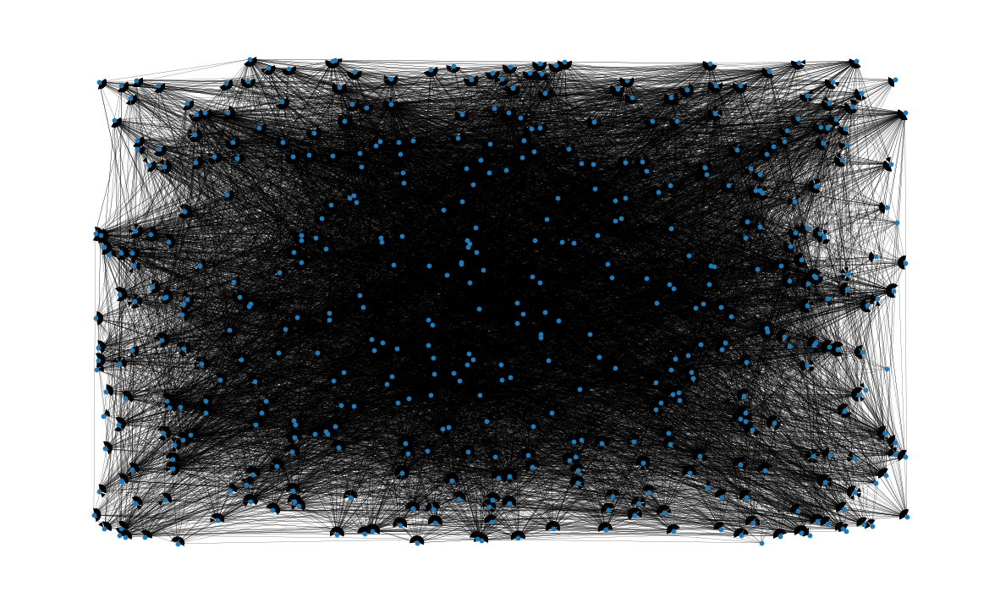

In [19]:
# Use random_layout to compute node positions
pos = nx.random_layout(G)

# Create a Matplotlib figure and axis for the graph visualization
fig, ax = plt.subplots(figsize=(15, 9))

# Turn off axis labels and ticks for a clean visualization
ax.axis("off")

# Update the plot_options dictionary to include 'node_size' based on degree centrality
plot_options = {
    "with_labels": False,
    "width": 0.15,
    "node_size": 10,
}

# Draw the network graph using NetworkX with the computed positions and updated plot_options
# - 'G' is the graph object
# - 'pos' specifies the node positions using a random layout
# - 'ax' is the Matplotlib axis to draw the graph on
# - **plot_options applies the defined visualization options
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

# Show the graph
plt.show()

The previous visualization is not particularly informative. Graphs of this type are often informally referred to as "hairballs" because they tend to display a chaotic jumble of overlapping edges.

To make sense of the data, we need a more structured approach to node positioning. That's where the spring_layout function comes into play, serving as the default layout function in NetworkX's drawing module. Unlike other layout methods, spring_layout considers both nodes and edges when determining node locations. However, there is a trade-off: this approach is computationally intensive and can be slow, especially for large graphs with hundreds of nodes and thousands of edges.

Given our dataset's 13,289 edges, we'll set a limit on the number of iterations for the spring_layout function to reduce computation time. Additionally, we'll save the computed layout for future visualizations.

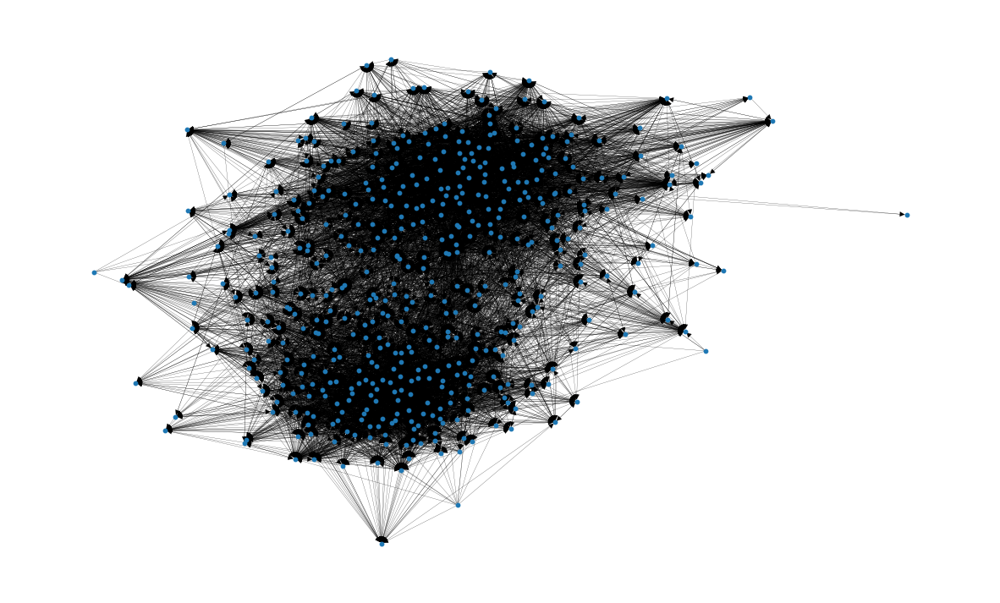

In [20]:
# Use spring_layout to compute node positions with specified options

# Iterations = It specifies the number of iterations the algorithm should perform to refine the positions.
# More iterations can result in more accurate positions but can be computationally expensive

# Seed = It sets a random seed for the layout calculation,
# making the results reproducible when the same seed is used
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Matplotlib figure and axis for the graph visualization
fig, ax = plt.subplots(figsize=(15, 9))

# Turn off axis labels and ticks for a clean visualization
ax.axis("off")

# Update the plot_options dictionary to include 'node_size' based on degree centrality
plot_options = {
    "with_labels": False,
    "width": 0.15,
    "node_size": 10,
}

# Draw the network graph using NetworkX with the computed positions and updated plot_options
nx.draw_networkx(G, pos=pos, ax=ax, **plot_options)

# Show the graph
plt.show()

This updated visualization is significantly more informative than the previous one. It provides valuable insights into the network's underlying structure. The spring_layout method offers a qualitative understanding of clustering within the network. However, it's important to note that spring_layout is not specifically tailored for systematic and repeatable clustering analysis.

# Basic topological attributes
Understanding the fundamental topological attributes of a network is crucial to uncovering its essential building blocks. These attributes serve as the cornerstone for assessing the network's structural properties, revealing vital insights into its organization, resilience, and efficiency. As we delve into this section, we will explore the key topological attributes that provide us with a lens to scrutinize networks more closely.

In [21]:
# We already have identified how many nodes and edges the network has
print(G)

DiGraph with 475 nodes and 13289 edges


In [22]:
# The average degree of a node can be seen.
np.mean([d for _, d in G.degree()])

55.95368421052632

On average, a node is connected to almost 56 other nodes, also known as neighbors of the node.
This has been calculated by creating a list of all the degrees of the nodes and using numpy.array to find the mean of the created list.

## Neighborhood of a Node
Further, we can look at the surrounding of a node, meaning the ones it is connected to, its **neighborhood**. Here, we can look at the **ego-network of a node**. That means how many nodes are in a certain **geodesic distance**, meaning the **shortest path**. Plainly speaking, how many nodes are not more than x-steps away.


In [23]:
# Calculate shortest path lengths for all pairs of nodes in the graph
shortest_path_lengths = dict(nx.all_pairs_shortest_path_length(G))

`nx.all_pairs_shortest_path_length` returns a dict-of-dict that maps a node u to all other nodes in the network, where the inner-most mapping returns the length of the shortest path between the two nodes. In other words, `shortest_path_lengths[u][v]` will return the shortest path length between any two pair of nodes `u` and `v`:

In [24]:
# Access the shortest path length between nodes 0 and 42 in the graph
shortest_path_lengths[0][42]

2

In [25]:
# Find all the shortest paths from source node 0 to target node 42 in the graph 'G'
path = list(nx.all_shortest_paths(G, source=0, target=42))

# Print the list of shortest paths
print(path)

[[0, 18, 42], [0, 77, 42], [0, 85, 42]]


In [26]:
# We take user 322 as an example
selected_user = 322

In [27]:
# Print a list of neighbors of node 0 in the graph 'G'
print(list(G.neighbors(selected_user)))

[1, 17, 41, 58, 73, 93, 95, 97, 101, 102, 103, 104, 105, 106, 111, 112, 113, 114, 116, 118, 120, 124, 129, 130, 131, 134, 137, 140, 141, 143, 144, 154, 159, 161, 162, 163, 165, 172, 174, 175, 176, 185, 188, 190, 191, 192, 198, 199, 201, 203, 206, 208, 209, 210, 211, 214, 215, 216, 218, 219, 222, 223, 228, 231, 233, 234, 235, 238, 239, 241, 242, 244, 245, 246, 249, 251, 255, 257, 260, 261, 269, 271, 272, 273, 274, 276, 277, 283, 288, 289, 290, 294, 295, 300, 301, 302, 306, 307, 309, 312, 314, 323, 324, 327, 328, 331, 333, 335, 336, 338, 339, 340, 343, 344, 346, 350, 360, 362, 370, 373, 380, 383, 384, 388, 389, 394, 396, 399, 402, 406, 413, 417, 419, 421, 422, 426, 427, 428, 429, 430, 432, 435, 437, 441, 449, 451, 452, 453, 457, 459, 461, 462, 464, 468, 470, 471, 472]


In [28]:
# Calculate the degree (number of neighbors) of the selected node in the graph 'G'
# by retrieving its neighbors and counting their number
degree_of_node = len(list(G.neighbors(selected_user)))

# Print the degree of the selected node
print(degree_of_node)

157


The following code calculates the average shortest path length for each node in a network. The average path length is a measure of how interconnected the network is, providing insights into how easily information or influence can flow between nodes. The code then computes the overall average path length for the entire network.

In [29]:
# Compute the average shortest path length for each node
average_path_lengths = [
    np.mean(list(spl.values())) for spl in shortest_path_lengths.values()
]
# The average over all nodes
np.mean(average_path_lengths)

2.352121341779345

This represents the average of the shortest path length for all pairs of nodes: in order to reach from one node to another node, roughly 2.35 edges will be traversed on average.

Text(0, 0.5, 'Frequency (%)')

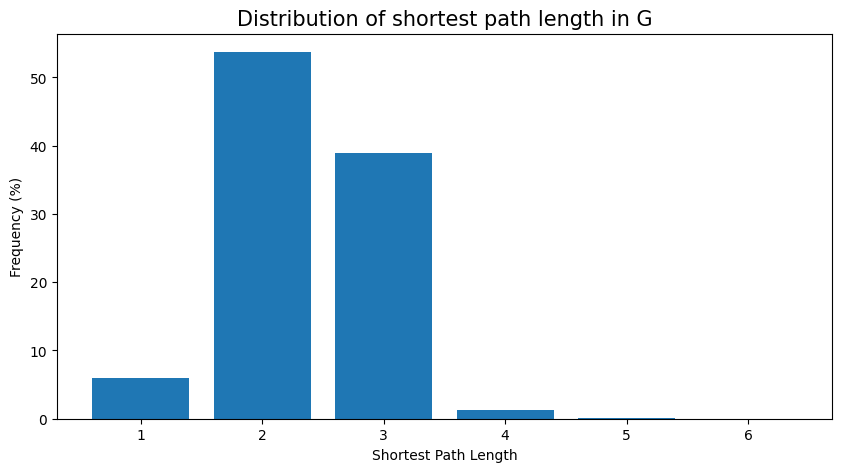

In [30]:
# We know the maximum shortest path length (the diameter), so create an array
# to store values from 0 up to (and including) 6
path_lengths = np.zeros(6 + 1, dtype=int)

# Extract the frequency of shortest path lengths between two nodes
for pls in shortest_path_lengths.values():
    pl, cnts = np.unique(list(pls.values()), return_counts=True)
    path_lengths[pl] += cnts

# Express frequency distribution as a percentage (ignoring path lengths of 0)
freq_percent = 100 * path_lengths[1:] / path_lengths[1:].sum()

# Plot the frequency distribution (ignoring path lengths of 0) as a percentage
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(np.arange(1, 6 + 1), height=freq_percent)
ax.set_title(
    "Distribution of shortest path length in G", fontdict={"size": 15}, loc="center"
)
ax.set_xlabel("Shortest Path Length", fontdict={"size": 10})
ax.set_ylabel("Frequency (%)", fontdict={"size": 10})

Most of the shortest path lengths in the network fall within a range of a few edges (2 and 3). It's exceedingly rare for a pair of nodes to be connected by a shortest path of length 5 (referred to as the network's diameter).

# Centrality measures (Node-Level measures)

Often, we are interested in ways to summarize the pattern of node connectivity to infer something on their characteristics.

One of the simplest concepts when computing node level measures is that of **centrality**, i.e. how central is a node or edge in the graph. As this definition is inherently vague, a lot of different centrality scores exists that all treat the concept of "central" a bit different.

We in the following well briefly illustrate the idea behind three of the most popular centrality measures, namely:

* Degree centrality
* Eigenvector centrality
* Betweenness centrality

## Degree centrality

The degree centrality is probably the most intuitive node measure, which basically just counts the number of edges adjacent to a node.  Formally, the degree of node $i$ is the number of existing edges $e_{ij}$ with other nodes $j$ in a network with $n$ nodes:

$$d_{ij} =\sum\limits_{j=1}^{n} e_{ij} ~ where: ~ i \neq j$$

In [31]:
# Calculating Degree Centrality and Degree in a Network Using NetworkX
centrality_dgr = nx.degree_centrality(G)
dgr = nx.degree(G)

In [32]:
# Computing and storing node degrees and degree centrality in a dictionary using NetworkX
dict_dgr = dict(nx.degree(G))
dict_centrality_dgr = dict(nx.degree_centrality(G))

In [33]:
# Calculating the degree of each node in the graph G
nx.degree(G)

DiDegreeView({0: 46, 4: 65, 12: 62, 18: 45, 25: 81, 30: 61, 46: 82, 55: 82, 58: 79, 59: 83, 74: 69, 76: 50, 77: 62, 85: 56, 86: 44, 87: 119, 154: 75, 168: 19, 341: 81, 374: 71, 401: 115, 3: 56, 14: 51, 17: 123, 24: 75, 27: 74, 64: 66, 79: 65, 84: 55, 88: 65, 89: 73, 149: 98, 179: 113, 197: 83, 213: 25, 224: 49, 243: 37, 250: 24, 268: 75, 286: 63, 293: 61, 315: 124, 447: 53, 460: 62, 11: 51, 13: 43, 32: 76, 57: 42, 91: 49, 126: 92, 162: 64, 254: 187, 255: 58, 327: 88, 334: 15, 392: 35, 398: 29, 448: 49, 454: 26, 470: 59, 2: 55, 9: 63, 28: 28, 42: 36, 50: 70, 54: 89, 68: 53, 110: 34, 217: 39, 229: 70, 299: 55, 442: 75, 48: 34, 53: 68, 61: 84, 71: 122, 75: 28, 80: 52, 111: 148, 123: 13, 136: 98, 147: 148, 193: 84, 205: 75, 215: 121, 247: 18, 278: 54, 387: 59, 393: 190, 403: 49, 450: 70, 452: 103, 21: 42, 47: 47, 70: 41, 72: 95, 138: 67, 160: 92, 161: 65, 190: 157, 234: 59, 246: 88, 260: 36, 306: 33, 335: 147, 389: 139, 415: 39, 422: 72, 428: 126, 20: 42, 26: 76, 36: 26, 38: 30, 130: 80, 1

In [34]:
# Calculating the degree centrality of each node in the graph G
nx.degree_centrality(G)

{0: 0.0970464135021097,
 4: 0.1371308016877637,
 12: 0.13080168776371306,
 18: 0.09493670886075949,
 25: 0.17088607594936708,
 30: 0.12869198312236285,
 46: 0.1729957805907173,
 55: 0.1729957805907173,
 58: 0.16666666666666666,
 59: 0.1751054852320675,
 74: 0.14556962025316456,
 76: 0.10548523206751054,
 77: 0.13080168776371306,
 85: 0.1181434599156118,
 86: 0.09282700421940927,
 87: 0.2510548523206751,
 154: 0.1582278481012658,
 168: 0.040084388185654005,
 341: 0.17088607594936708,
 374: 0.14978902953586495,
 401: 0.24261603375527424,
 3: 0.1181434599156118,
 14: 0.10759493670886075,
 17: 0.25949367088607594,
 24: 0.1582278481012658,
 27: 0.1561181434599156,
 64: 0.13924050632911392,
 79: 0.1371308016877637,
 84: 0.11603375527426159,
 88: 0.1371308016877637,
 89: 0.15400843881856538,
 149: 0.20675105485232065,
 179: 0.23839662447257381,
 197: 0.1751054852320675,
 213: 0.05274261603375527,
 224: 0.10337552742616032,
 243: 0.0780590717299578,
 250: 0.050632911392405056,
 268: 0.15822784

In [35]:
# Example 0; 46 edges adjacent to node 0
nx.degree(G)[0]

46

In [36]:
# Example 0; approx 9.7 %
nx.degree_centrality(G)[0] * 100

9.70464135021097

In [37]:
# Finding top 10 nodes with the highest degrees
sorted(dict_dgr.items(),key=lambda x:-x[1])[:10]

[(322, 284),
 (367, 261),
 (393, 190),
 (254, 187),
 (208, 182),
 (303, 163),
 (269, 163),
 (190, 157),
 (399, 152),
 (111, 148)]

In [38]:
# Finding top 10 nodes with the highest degree centrality
sorted(dict_centrality_dgr.items(),key=lambda x:-x[1])[:10]

[(322, 0.5991561181434598),
 (367, 0.550632911392405),
 (393, 0.4008438818565401),
 (254, 0.3945147679324894),
 (208, 0.38396624472573837),
 (303, 0.34388185654008435),
 (269, 0.34388185654008435),
 (190, 0.3312236286919831),
 (399, 0.32067510548523204),
 (111, 0.3122362869198312)]

The higher the degree centrality a node has, the more edges are connected to the particular node and thus this node has more neighbor nodes (twitter interaction).

Here we see that node 322 has the highest degree centrality with 284 number of edges meaning that this user has connections with around 60 % of the network, followed by node 367 there has the second highest degree centrality covering around 55% of the network, with 261 number of edges.

In [39]:
# This line utilizes NetworkX to set the 'dgr' and 'centrality_dgr' attribute for each node in the graph G,
# based on the values stored in the dictionary 'dict_dgr' and 'centrality_dgr'
nx.set_node_attributes(G, dict_dgr, 'dgr')
nx.set_node_attributes(G, dict_centrality_dgr, 'centrality_dgr')

In [40]:
# Sort nodes by degree centrality in descending order and select the top 10 nodes
top_nodes_dgr = sorted(centrality_dgr, key=centrality_dgr.get, reverse=True)[:10]

In [41]:
# Your existing code to compute the 'pos' dictionary using spring_layout
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Plotly figure for the graph visualization
fig = go.Figure()

# Add edges to the figure
for edge in G.edges():
    source, target = edge
    x0, y0 = pos[source]
    x1, y1 = pos[target]
    fig.add_trace(go.Scatter(x=[x0, x1, None], y=[y0, y1, None], mode='lines', line=dict(width=0.15, color='black')))

# Add nodes to the figure
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_colors = ['red' if node in top_nodes_dgr else 'darkblue' for node in G.nodes()]

# Define the trace for nodes with customized colors
# Filter out non-numeric or negative values from the 'size' list
filtered_size = [40 * centrality_dgr[node] for node in G.nodes()]
filtered_size = [s for s in filtered_size if isinstance(s, (int, float)) and s >= 0]

# Define the trace for nodes with customized colors (interactive part)
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=[G.nodes[node]['username'] for node in G.nodes()],
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        size=filtered_size,
        colorbar=dict(thickness=15, title='Node Centrality'),
        color=node_colors
    )
)

# Add the node trace to the figure
fig.add_trace(node_trace)

# Update layout properties to hide axis labels and the legend
fig.update_xaxes(showline=False, showgrid=False, zeroline=False)
fig.update_yaxes(showline=False, showgrid=False, zeroline=False)

# Update layout properties to remove background color and axis values
fig.update_layout(
    showlegend=False, # Hide the legend
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    xaxis_showgrid=False, yaxis_showgrid=False,  # Hide grid lines
    xaxis_zeroline=False, yaxis_zeroline=False,  # Hide zero lines
    xaxis_showticklabels=False, yaxis_showticklabels=False,  # Hide axis labels
    hovermode='closest',
    title="Interactive Network Graph by node size: degree centrality",
)

# Customize node labels
node_info = [G.nodes[node]['username'] for node in top_nodes_dgr]
node_info = [f"{i+1}. {node}" for i, node in enumerate(node_info)]
node_trace.text = node_info

# Display the interactive Plotly graph
fig.show()

## Eigenvector centrality
Similar to the degree centrality, the eigenvector centrality takes this idea of characterizing nodes by their importance in a network a step further. It also represents the main idea behind the pagerank algorithm (a variant of eigenvector centrality) that was powering Google Search in the beginning.

The basic idea is to weight a node's degree centrality by the centrality of the nodes adjacent to it (and their centrality in turn by their centrality). This will make nodes connected to in turn also well connected nodes more important. The eigenvector here is just a clever mathematical trick to solve such a recurrent problem.

$$x_{v}={\frac {1}{\lambda }}\sum _{t\in M(v)}x_{t}={\frac {1}{\lambda }}\sum _{t\in G}a_{v,t}x_{t}$$

In [42]:
# Calculating Eigenvector Centrality in a Network Using NetworkX
# considering edge weights defined by the 'weight' attribute.
centrality_eig = nx.eigenvector_centrality_numpy(G, weight = 'weight')

Eigenvector centrality is a measure of a node's influence in a network, considering both its direct connections and the influence of its neighbors. When the 'weight' parameter is specified, it indicates that edge weights should be considered in the centrality calculation.

In [43]:
# Computing and storing Eigenvector Centrality in a dictionary using NetworkX
dict_centrality_eig = dict(nx.eigenvector_centrality(G))

In [44]:
# Finding top 10 nodes with the highest eigenvector centrality
sorted(dict_centrality_eig.items(),key=lambda x:-x[1])[:10]

[(322, 0.17722011722287775),
 (190, 0.17202920711885605),
 (208, 0.16284923539657067),
 (269, 0.15987450909251819),
 (385, 0.15261404113329607),
 (192, 0.1482315320475691),
 (389, 0.13679554894194895),
 (188, 0.13436485278914878),
 (324, 0.12886744211767856),
 (113, 0.12793308077287288)]

Node 322 has the highest eigenvector centrality of 0.1772 suggesting this node and twitter user has a high level of influence within the network.

The eigenvector centrality is a representation of the node's influence in relation to other nodes in the network. A higher eigenvector centrality value typically signifies a node that is also well-connected to other important nodes within the network.

Based on this some implications might be drawn:
* Dominant Influence: As the node holds the highest eigenvector centrality, it signifies that, within the network, this node is the most influential relative to all other nodes. Its connections and relationships with other nodes contribute significantly to its high centrality.
* Key Connector: This node likely acts as a crucial connector within the network. Its connections to other nodes, especially those with their own high centrality, enhance its overall influence and importance.
* Indirect Influence: The high eigenvector centrality suggests that this node is not only directly connected to other nodes but also indirectly influential through its association with other highly influential nodes. It has connections with nodes that themselves have considerable influence, thereby contributing to its high centrality score.
* Network Control: The node's high eigenvector centrality indicates that, to a certain extent, it might control or strongly influence the flow of information, interactions, or dynamics within the network. Changes or actions involving this node could have a significant impact on the network as a whole

In [45]:
# Assigning Eigenvector Centrality as Node Attribute
nx.set_node_attributes(G, dict_centrality_eig, 'centrality_eig')

In [46]:
# Scaling eigenvector centrality values of nodes within the network by multiplying each value by 100
# Loop that iterates through each key (node) in the dictionary
for  i in dict_centrality_eig:
  dict_centrality_eig[i] = dict_centrality_eig[i] * 100

In [47]:
# Sort nodes by eigenvector centrality in descending order and select the top 10 nodes
top_nodes_eig = sorted(centrality_eig, key=centrality_eig.get, reverse=True)[:10]

In [48]:
# Your existing code to compute the 'pos' dictionary using spring_layout
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Plotly figure for the graph visualization
fig = go.Figure()

# Add edges to the figure
for edge in G.edges():
    source, target = edge
    x0, y0 = pos[source]
    x1, y1 = pos[target]
    fig.add_trace(go.Scatter(x=[x0, x1, None], y=[y0, y1, None], mode='lines', line=dict(width=0.15, color='black')))

# Add nodes to the figure
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_colors = ['red' if node in top_nodes_eig else 'darkblue' for node in G.nodes()]

# Define the trace for nodes with customized colors
# Filter out non-numeric or negative values from the 'size' list
filtered_size = [100 * centrality_eig[node] for node in G.nodes()]
filtered_size = [s for s in filtered_size if isinstance(s, (int, float)) and s >= 0]

# Define the trace for nodes with customized colors (interactive part)
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=[G.nodes[node]['username'] for node in G.nodes()],
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        size=filtered_size,
        colorbar=dict(thickness=15, title='Node Centrality'),
        color=node_colors
    )
)

# Add the node trace to the figure
fig.add_trace(node_trace)

# Update layout properties to hide axis labels and the legend
fig.update_xaxes(showline=False, showgrid=False, zeroline=False)
fig.update_yaxes(showline=False, showgrid=False, zeroline=False)

# Update layout properties to remove background color and axis values
fig.update_layout(
    showlegend=False, # Hide the legend
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    xaxis_showgrid=False, yaxis_showgrid=False,  # Hide grid lines
    xaxis_zeroline=False, yaxis_zeroline=False,  # Hide zero lines
    xaxis_showticklabels=False, yaxis_showticklabels=False,  # Hide axis labels
    hovermode='closest',
    title="Interactive Network Graph by node size: eigenvector centrality",
)

# Customize node labels
node_info = [G.nodes[node]['username'] for node in top_nodes_eig]
node_info = [f"{i+1}. {node}" for i, node in enumerate(node_info)]
node_trace.text = node_info

# Display the interactive Plotly graph
fig.show()

## Betweenness centrality

* The betweenness centrality of an object in a network measures the extent to which it lies on short paths
* A higher betweenness indicates that it lies on more short paths and hence should somehow be important for traversing between different parts of a network - meaning it acts as a bridge

This measure is associated with the user’s ability to influence others. A user with a high betweenness centrality acts as a bridge to many users that are not "followers" and thus has the ability to influence them by conveying information (e.g. by quote tweeted or retweet).

In formulaic representation

* The geodesic betweenness $B_{n}(i)$ of a **vertex** in a weighted, undirected network is
$$B_{n}(i) =  \sum_{s,t \in G} \frac{ \Psi_{s,t}(i) }{\Psi_{s,t}}$$
where vertices $s,t,i$ are all different from each other

* $\Psi_{s,t}$ denotes the number of shortest paths (geodesics) between vertices $s$ and $t$
* $\Psi_{s,t}(i)$ denotes the number of shortest paths (geodesics) between vertices $s$ and $t$ **that pass through vertex** $i$.
* The geodesic betweenness $B_n$ of a network is the mean of $B_n(i)$ over all vertices $i$

In [49]:
# Calculating Betweenness Centrality in a Network Using NetworkX
centrality_between = nx.betweenness_centrality(G)

In [50]:
# Computing and storing Betweenness Centrality in a dictionary using NetworkX
dict_centrality_between = dict(nx.betweenness_centrality(G))

In [51]:
# Finding top 10 nodes with the highest betweenness centrality
sorted(dict_centrality_between.items(),key=lambda x:-x[1])[:10]

[(322, 0.07304129664896897),
 (367, 0.0414124018031625),
 (254, 0.030683029768814818),
 (393, 0.027177654998646057),
 (335, 0.017752747790576638),
 (208, 0.016859674922057966),
 (17, 0.016458843425795636),
 (303, 0.015541875816039118),
 (461, 0.014341895456150286),
 (113, 0.012721704743944165)]

Node 322 is also the node with the highest betweeness centrality of 0.07. This mean that, within the context of a network, this specific node (node 322) holds a relatively significant position in terms of facilitating the flow of information or interactions between other nodes.

* It suggests that this node is positioned in a way that a significant proportion of the shortest paths between other nodes in the network pass through it.
* Removing or disrupting this node might potentially impede the flow of information or interactions between other nodes in the network.

In [52]:
# Assigning Betweenness Centrality as Node Attribute and Visualizing the Network"
nx.set_node_attributes(G, dict_centrality_between, 'centrality_between')

In [53]:
# Scaling betweenness centrality values of nodes within the network by multiplying each value by 100
for  i in centrality_between:
  centrality_between[i] = centrality_between[i] * 100

In [54]:
# Sort nodes by betweenness centrality in descending order and select the top 10 nodes
top_nodes_between = sorted(centrality_between, key=centrality_between.get, reverse=True)[:10]

In [55]:
# Your existing code to compute the 'pos' dictionary using spring_layout
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Plotly figure for the graph visualization
fig = go.Figure()

# Add edges to the figure
for edge in G.edges():
    source, target = edge
    x0, y0 = pos[source]
    x1, y1 = pos[target]
    fig.add_trace(go.Scatter(x=[x0, x1, None], y=[y0, y1, None], mode='lines', line=dict(width=0.15, color='black')))

# Add nodes to the figure
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_colors = ['red' if node in top_nodes_between else 'darkblue' for node in G.nodes()]

# Define the trace for nodes with customized colors
# Filter out non-numeric or negative values from the 'size' list
filtered_size = [15 * centrality_between[node] for node in G.nodes()]
filtered_size = [s for s in filtered_size if isinstance(s, (int, float)) and s >= 0]

# Define the trace for nodes with customized colors (interactive part)
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=[G.nodes[node]['username'] for node in G.nodes()],
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        size=filtered_size,
        colorbar=dict(thickness=15, title='Node Centrality'),
        color=node_colors
    )
)

# Add the node trace to the figure
fig.add_trace(node_trace)

# Update layout properties to hide axis labels and the legend
fig.update_xaxes(showline=False, showgrid=False, zeroline=False)
fig.update_yaxes(showline=False, showgrid=False, zeroline=False)

# Update layout properties to remove background color and axis values
fig.update_layout(
    showlegend=False, # Hide the legend
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    xaxis_showgrid=False, yaxis_showgrid=False,  # Hide grid lines
    xaxis_zeroline=False, yaxis_zeroline=False,  # Hide zero lines
    xaxis_showticklabels=False, yaxis_showticklabels=False,  # Hide axis labels
    hovermode='closest',
    title="Interactive Network Graph by node size: betweenness centrality",
)

# Customize node labels
node_info = [G.nodes[node]['username'] for node in top_nodes_between]
node_info = [f"{i+1}. {node}" for i, node in enumerate(node_info)]
node_trace.text = node_info

# Display the interactive Plotly graph
fig.show()

## Node importance and identify key node (centrality analysis)
In network analysis, understanding the importance of nodes is crucial for gaining insights into the structure, functionality, and significance of a network. Node importance refers to the relative influence, centrality, or significance of individual nodes within a network. Identifying key nodes, often referred to as "centrality analysis," involves quantifying and ranking nodes based on various centrality metrics to determine their significance.

In [56]:
# Printing top 10 nodes with the highest centralities
print("Degree Centrality:")
top_10_dgr = sorted(dict_centrality_dgr.items(), key=lambda x: -x[1])[:10]
print(top_10_dgr)

print(' ')

print("Eigenvector Centrality:")
top_10_eig = sorted(dict_centrality_eig.items(),key=lambda x:-x[1])[:10]
print(top_10_eig)

print(' ')

print("Betweenness Centrality:")
top_10_between = sorted(dict_centrality_between.items(),key=lambda x:-x[1])[:10]
print(top_10_between)

Degree Centrality:
[(322, 0.5991561181434598), (367, 0.550632911392405), (393, 0.4008438818565401), (254, 0.3945147679324894), (208, 0.38396624472573837), (303, 0.34388185654008435), (269, 0.34388185654008435), (190, 0.3312236286919831), (399, 0.32067510548523204), (111, 0.3122362869198312)]
 
Eigenvector Centrality:
[(322, 17.722011722287775), (190, 17.202920711885604), (208, 16.28492353965707), (269, 15.987450909251818), (385, 15.261404113329608), (192, 14.823153204756908), (389, 13.679554894194895), (188, 13.436485278914878), (324, 12.886744211767857), (113, 12.793308077287287)]
 
Betweenness Centrality:
[(322, 0.07304129664896897), (367, 0.0414124018031625), (254, 0.030683029768814818), (393, 0.027177654998646057), (335, 0.017752747790576638), (208, 0.016859674922057966), (17, 0.016458843425795636), (303, 0.015541875816039118), (461, 0.014341895456150286), (113, 0.012721704743944165)]


We see that it is not given that because a node has a high degree centrality or betweenness centrality, it will also have a high eigenvector centrality. It is actually only the case for node 322 which has the highest centrality of all three.
* Let's look at node 367 as an example. This Twitter user has the second highest degree centrality and betweenness centrality but is not present in the top 10 nodes with the highest eigenvector centrality. This implies that this user might be central in the local context: While it might be highly connected and significant in terms of mediating traffic between nodes, its influence might be more localized within certain parts of the network rather than spread across the entire network. It could be significant within specific clusters or communities but not as influential in the overall network.

For the rest of the top 10 there is not a clear pattern of nodes that has both the high degree centrality, eigenvector centrality and betweenes centrality. But a lot of the same nodes like 208, 254, 393, 269 etc. are present in the top 10 for all of the three centralities indicating that thise nodes also have somewhat of an influence on the overall network

In [57]:
# Let's look at node 322

# Node characteristics
G.nodes()[322]

{'username': 'GOPLeader',
 'dgr': 284,
 'centrality_dgr': 0.5991561181434598,
 'centrality_eig': 0.17722011722287775,
 'centrality_between': 0.07304129664896897}

Node 322 exhibits the highest values for degree centrality, eigenvector centrality, and betweenness centrality in the network. It can suggests several important characteristics and potential implications within the network:

1. High Connectivity: The highest degree centrality implies that node 322 has the most direct connections or edges in the network compared to other nodes.
2. Influence and Importance: The highest eigenvector centrality indicates that node 322 is not only well-connected but is connected to other nodes that are themselves influential or central within the network.
3. Bridge and Critical Pathways: The highest betweenness centrality suggests that node 322 lies on a significant proportion of shortest paths between other nodes. It acts as a critical bridge or hub through which a substantial amount of communication or interactions pass.

The simultaneous high values across all three centrality metrics for node 322 suggest that it holds a pivotal position within the network:
* Centrality Hub: Node 322 acts as a significant hub, being highly connected, influential due to its connections to other influential nodes, and critical for maintaining network cohesion by serving as a bridge or crucial pathway for communication.

This node likely plays a crucial role in information flow, communication, and interactions within the network. Its removal or disturbance might significantly impact the network's structure and functionality due to its central position and critical role in connecting various parts of the network.


# Data filtering and subsetting
Data filtering and subsetting are important techniques in network analysis to focus on specific subsets of data within a larger network. These techniques allow researchers to extract and study relevant information, reduce noise, and gain insights into the underlying structure and relationships within the network.

Subsetting can be a bit challenging at times. It's important to keep in mind that when working with NetworkX, we are expected to provide a list of Node-IDs for subsetting. The most straightforward and possibly the most elegant approach in this context is to employ a list comprehension with a conditional statement like `if d > X`.

In [58]:
# Subset the graph keeping only nodes with degree > 50
# filtering all the people out which only have a connection to 50 person in the nw
G_subset_1 = nx.subgraph(G, [n for n,d in G.degree() if d > 50])

In [59]:
# As we can see we still have 222 nodes and 6,221 edges
print(G_subset_1)

DiGraph with 222 nodes and 6221 edges


In [60]:
# Create a Pandas DataFrame 'nodes_df' from the nodes of the NetworkX graph 'G'
# The DataFrame will store node attributes as columns and use node IDs as indices
nodes_df = pd.DataFrame.from_dict(dict(G.nodes(data=True)), orient='index')

# Display the first few rows of the DataFrame
nodes_df.head()

,username,dgr,centrality_dgr,centrality_eig,centrality_between
0,SenatorBaldwin,46,0.097046,0.014620,0.001093
4,SenBlumenthal,65,0.137131,0.020422,0.002139
12,SenatorCardin,62,0.130802,0.024578,0.003692
18,SenCortezMasto,45,0.094937,0.013261,0.000975
25,SenatorDurbin,81,0.170886,0.029593,0.004577


In [61]:
# Because of weak filtering/subsetting above we are performing
# extreme subsetting by only keeping only top nodes (top 10 %)
top_central_nodes = nodes_df[nodes_df.centrality_eig > nodes_df.centrality_eig.quantile(0.90)].index
top_central_nodes

Int64Index([401, 254, 111, 147, 215, 393, 452, 161, 190, 246, 335, 389, 428,
            130,  92, 137, 400, 188, 143, 105, 303, 318, 461, 113, 242, 385,
            132, 134, 322, 370, 116, 417, 350, 324, 399, 244, 354, 103, 245,
            269, 192, 208, 301, 343, 382, 261, 386, 276],
           dtype='int64')

In [62]:
# Create subset graph based on the original graph and the defined top_central_nodes
G_sub = nx.subgraph(G, top_central_nodes)

In [63]:
# Now we only have 119 nodes and 2,766 edges
print(G_sub)

DiGraph with 48 nodes and 825 edges


In [64]:
# Sort nodes by betweenness centrality in descending order and select the top 10 nodes
top_nodes_eig = sorted(centrality_eig, key=centrality_eig.get, reverse=True)[:10]

In [65]:
# Your existing code to compute the 'pos' dictionary using spring_layout
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Plotly figure for the graph visualization
fig = go.Figure()

# Add edges to the figure
for edge in G_sub.edges():
    source, target = edge
    x0, y0 = pos[source]
    x1, y1 = pos[target]
    fig.add_trace(go.Scatter(x=[x0, x1, None], y=[y0, y1, None], mode='lines', line=dict(width=0.15, color='black')))

# Add nodes to the figure
node_x = []
node_y = []
for node in G_sub.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_colors = ['red' if node in top_nodes_eig else 'darkblue' for node in G_sub.nodes()]

# Filter out non-numeric or negative values from the 'size' list
filtered_size = [100 * centrality_eig[node] for node in G_sub.nodes()]
filtered_size = [s for s in filtered_size if isinstance(s, (int, float)) and s >= 0]

# Define the trace for nodes with customized colors
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=[G_sub.nodes[node]['username'] for node in G_sub.nodes()],
    marker=dict(
        showscale=False,
        colorscale='YlGnBu',
        size=filtered_size,
        colorbar=dict(thickness=15, title='Node Centrality'),
        color=node_colors
    )
)

# Add the node trace to the figure
fig.add_trace(node_trace)

# Update layout properties to hide axis labels and the legend
fig.update_xaxes(showline=False, showgrid=False, zeroline=False)
fig.update_yaxes(showline=False, showgrid=False, zeroline=False)

# Update layout properties to remove background color and axis values
fig.update_layout(
    showlegend=False,  # Hide the legend
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    xaxis_showgrid=False, yaxis_showgrid=False,  # Hide grid lines
    xaxis_zeroline=False, yaxis_zeroline=False,  # Hide zero lines
    xaxis_showticklabels=False, yaxis_showticklabels=False,  # Hide axis labels
    hovermode='closest',
    title="Interactive Network Graph by node size: eigenvector centrality",
)

# Customize node labels
node_info = [G.nodes[node]['username'] for node in top_nodes_eig]
node_info = [f"{i+1}. {node}" for i, node in enumerate(node_info)]
node_trace.text = node_info

# Display the interactive Plotly graph
fig.show()


# Community Detection

Another common operation is to group nodes based on the graph topology, sometimes referred to as *community detection* based on its commonality in social network analysis.

There are-just like for clustering of tabular data in UML-many different algorithms and approaches to detect and delineate communities.

The main logic in most cases is to find ways to form groups which have a maximum *within-connectivity* and a minimum *between-connectivity*. Consequently, nodes in the same community should have a higher probability of being connected than nodes from different communities.

Here we will use the **Louvain Method**, one of the most widely used community detection algorithms. It usually delivers good results, scales well, and can handle weighted networks.

It optimises a quantity called modularity:

$$  \sum_{ij} (A_{ij} - \lambda P_{ij}) \delta(c_i,c_j) $$

$A$ - The adjacency matrix

$P_{ij}$ - The expected connection between $i$ and $j$.

$\lambda$ - Resolution parameter

Can use lots of different forms for $P_{ij}$ but the standard one is the so called configuration model:

$P_{ij} = \frac{k_i k_j}{2m}$

Loosely speaking, in an iterative process it

1. You take a node and try to aggregate it to one of its neighbours.
2. You choose the neighbour that maximizes a modularity function. This function tells you how connected is the community you are trying to attach your node to going to be if you actually attach your node to it (this function is easy to compute and this makes Louvain very fast!).
3. Once you iterate through all the nodes, you will have merged few nodes together and formed some communities.
4. This becomes the new input for the algorithm that will treat each community as a node and try to merge them together to create bigger communities.
5. The algorithm stops when it's not possible to improve modularity any more.

Most community detection algorithms implemented in `NetworkX` only work with undirected networks. Since our network is **directed** we convert it into an **undirected** one.

In [66]:
# We convert our directed network into an undirected one
G_und = nx.to_undirected(G_sub)

In [67]:
# Identifying optimal communities with the Louvain Algorithm
# 'best_partition' stops when the optimal number of communities have been reached
partition = community_louvain.best_partition(G_und)

In [68]:
# Setting partition as an attribute of the Graph and name it community
nx.set_node_attributes(G_und, partition, 'community')

In [69]:
# Finding the max number of communities
max(partition.values())+1

5

In [70]:
# Create a Pandas DataFrame 'nodes_df_und' from the attributes of nodes in the NetworkX graph 'G_und'
nodes_df_und = pd.DataFrame.from_dict(dict(G_und.nodes(data=True)), orient='index')

# Display the first few rows of the DataFrame 'nodes_df_und'
nodes_df_und.head()

,username,dgr,centrality_dgr,centrality_eig,centrality_between,community
385,RepJohnRose,128,0.270042,0.152614,0.003320,1
130,RepKenBuck,80,0.168776,0.075995,0.004052,1
382,RepTomRice,94,0.198312,0.103494,0.004320,1
132,RepTedBudd,94,0.198312,0.098223,0.002704,1
389,RepChipRoy,139,0.293249,0.136796,0.011770,2


In [71]:
# Let's see who are the most central users in the network
# For that we can e.g. sort the dataframe by eigenvector (we take only first 10 rows)
nodes_df_und.sort_values('centrality_eig', ascending=False)[:10]

,username,dgr,centrality_dgr,centrality_eig,centrality_between,community
322,GOPLeader,284,0.599156,0.177220,0.073041,3
190,RepJeffDuncan,157,0.331224,0.172029,0.007466,3
208,RepFranklin,182,0.383966,0.162849,0.016860,0
269,RepMikeJohnson,163,0.343882,0.159875,0.011213,3
385,RepJohnRose,128,0.270042,0.152614,0.003320,1
192,RepTomEmmer,148,0.312236,0.148232,0.012652,1
389,RepChipRoy,139,0.293249,0.136796,0.011770,2
188,RepDonaldsPress,140,0.295359,0.134365,0.009051,0
324,RepLisaMcClain,106,0.223629,0.128867,0.003984,1
113,RepAndyBiggsAZ,142,0.299578,0.127933,0.012722,2


Eigenvector centrality is a measure of a node's influence in a network, considering both its direct connections and the influence of its neighbors. Just as seen previously user 322 has the highest influence on the overall network based on the eigenvector centrality, followed by user 190.

Let's look at the size of the communities and find the most central users within these:

In [72]:
# How many communities are there (identified automatically)
nodes_df_und.community.nunique()

5

In [73]:
# Let's look at how many users there are in each community
nodes_df_und.community.value_counts()

1    13
3    10
4    10
2     8
0     7
Name: community, dtype: int64

In [74]:
# Display the community IDs by their frequency
top_com = nodes_df_und.community.value_counts().index
top_com

Int64Index([1, 3, 4, 2, 0], dtype='int64')

In [75]:
# Extract nodes belonging to the communities identified earlier
top_com_nodes = nodes_df_und[nodes_df_und.community.isin(top_com)].index

In [76]:
# Create a subgraph containing only the nodes belonging to the identified communities
G_und_sub = nx.subgraph(G_und, top_com_nodes)

In [77]:
# Filter the DataFrame to retain rows related to the identified communities
nodes_df_top = nodes_df_und[nodes_df_und.community.isin(top_com)]
nodes_df_top

,username,dgr,centrality_dgr,centrality_eig,centrality_between,community
385,RepJohnRose,128,0.270042,0.152614,0.003320,1
130,RepKenBuck,80,0.168776,0.075995,0.004052,1
382,RepTomRice,94,0.198312,0.103494,0.004320,1
132,RepTedBudd,94,0.198312,0.098223,0.002704,1
389,RepChipRoy,139,0.293249,0.136796,0.011770,2
134,michaelcburgess,97,0.204641,0.087202,0.007127,3
261,RepJacobs,67,0.141350,0.084429,0.001054,1
386,RepRosendale,110,0.232068,0.125461,0.004212,2
393,RepBobbyRush,190,0.400844,0.087264,0.027178,4
137,RepKatCammack,125,0.263713,0.110836,0.010075,0


In [78]:
# Let's look at the "most important" users by grouping up and keeping the 5 observations
# with the highest eigenvector centrality

# Identify the top 5 nodes with highest eigenvector centrality within each of the identified communities
top_people = nodes_df_top.groupby('community')['centrality_eig'].nlargest(5).reset_index()
top_people

,community,level_1,centrality_eig
0,0,208,0.162849
1,0,188,0.134365
2,0,335,0.122783
3,0,137,0.110836
4,0,350,0.108466
5,1,385,0.152614
6,1,192,0.148232
7,1,324,0.128867
8,1,244,0.123643
9,1,116,0.106453


In [79]:
# Identify and list isolated nodes in the NetworkX graph 'G_und'

# This is the nodes which is not connected to anyone
# No need to filter for parallel edges and seems there are no isolates (degree 0 nodes)
list(nx.isolates(G_und))

[]

Let's make some visualizations of the network with the communities

In [80]:
# Generate a list of nodes along with their attributes and characteristics in the NetworkX graph 'G_und'
list(G_und.nodes(data=True))

[(385,
  {'username': 'RepJohnRose',
   'dgr': 128,
   'centrality_dgr': 0.270042194092827,
   'centrality_eig': 0.15261404113329607,
   'centrality_between': 0.0033203972448132063,
   'community': 1}),
 (130,
  {'username': 'RepKenBuck',
   'dgr': 80,
   'centrality_dgr': 0.16877637130801687,
   'centrality_eig': 0.07599489688810072,
   'centrality_between': 0.004051588875379127,
   'community': 1}),
 (382,
  {'username': 'RepTomRice',
   'dgr': 94,
   'centrality_dgr': 0.19831223628691982,
   'centrality_eig': 0.10349381529853963,
   'centrality_between': 0.004320082424044313,
   'community': 1}),
 (132,
  {'username': 'RepTedBudd',
   'dgr': 94,
   'centrality_dgr': 0.19831223628691982,
   'centrality_eig': 0.09822283058697386,
   'centrality_between': 0.002704340715319443,
   'community': 1}),
 (389,
  {'username': 'RepChipRoy',
   'dgr': 139,
   'centrality_dgr': 0.2932489451476793,
   'centrality_eig': 0.13679554894194895,
   'centrality_between': 0.011770357581061843,
   'commun

In [81]:
# Your existing code to compute the 'pos' dictionary using spring_layout
pos = nx.spring_layout(G, iterations=30, seed=1721)

# Create a Plotly figure for the graph visualization
fig = go.Figure()

partition = community_louvain.best_partition(G_und)

# Add edges to the figure
for edge in G_und.edges():
    source, target = edge
    x0, y0 = pos[source]
    x1, y1 = pos[target]
    fig.add_trace(go.Scatter(x=[x0, x1, None], y=[y0, y1, None], mode='lines', line=dict(width=0.15, color='black')))

# Add nodes to the figure with colors based on communities
node_x = []
node_y = []
node_colors = []

for node in G_und.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    community_id = partition[node]
    node_colors.append(community_id)

# Define the trace for nodes with customized colors
# Filter out non-numeric or negative values from the 'size' list
filtered_size = [100 * centrality_eig[node] for node in G_und.nodes()]
filtered_size = [s for s in filtered_size if isinstance(s, (int, float)) and s >= 0]

# Define the trace for nodes with customized colors
node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=[G.nodes[node]['username'] for node in G_und.nodes()],
    marker=dict(
        showscale=False,
        colorscale='Viridis',
        size=filtered_size,
        colorbar=dict(thickness=15, title='Community'),
        color=node_colors
    )
)

# Add the node trace to the figure
fig.add_trace(node_trace)

# Update layout properties to hide axis labels and the legend
fig.update_xaxes(showline=False, showgrid=False, zeroline=False)
fig.update_yaxes(showline=False, showgrid=False, zeroline=False)

# Update layout properties to remove background color and axis values
fig.update_layout(
    showlegend=False, # Hide the legend
    plot_bgcolor='rgba(0,0,0,0)',  # Set background color to transparent
    xaxis_showgrid=False, yaxis_showgrid=False,  # Hide grid lines
    xaxis_zeroline=False, yaxis_zeroline=False,  # Hide zero lines
    xaxis_showticklabels=False, yaxis_showticklabels=False,  # Hide axis labels
    hovermode='closest',
    title="Interactive Network Graph by node size: eigenvector centrality",
)

# Customize node labels
node_info = [G_und.nodes[node]['username'] for node in top_nodes_eig]
node_info = [f"{i+1}. {node}" for i, node in enumerate(node_info)]
node_trace.text = node_info

# Display the interactive Plotly graph
fig.show()

### (Global) Network Structure
Finally, it is often also informative to look at the overal characteristics of the network.


The **density** of a measure represents the share of all connected to all possible connections in the network.

In [82]:
# Calculate the density of the NetworkX graph 'G'
nx.density(G)

0.05902287363979569

In [83]:
# Calculate the density of the undirected NetworkX graph 'G_und'
nx.density(G_und)

0.4778368794326241

The code calculates the graph's density, revealing that the network is notably sparse, given that the density is less than 1 (`density < 1`). This indicates that a significant portion of possible connections is not present in the graph G. For the undirected network the graph G_und is moderately connected, indicating a significant number of edges existing among the nodes.


**Transistivity**, also called the **Clustering Coefficient** indicates how much the network tends to be locally clustered. That is measured by the share of **closed triplets**. In simple terms, the clustering coefficient measures the likelihood that two nodes connected to a common neighbor are also connected to each other.

Text(0, 0.5, 'Counts')

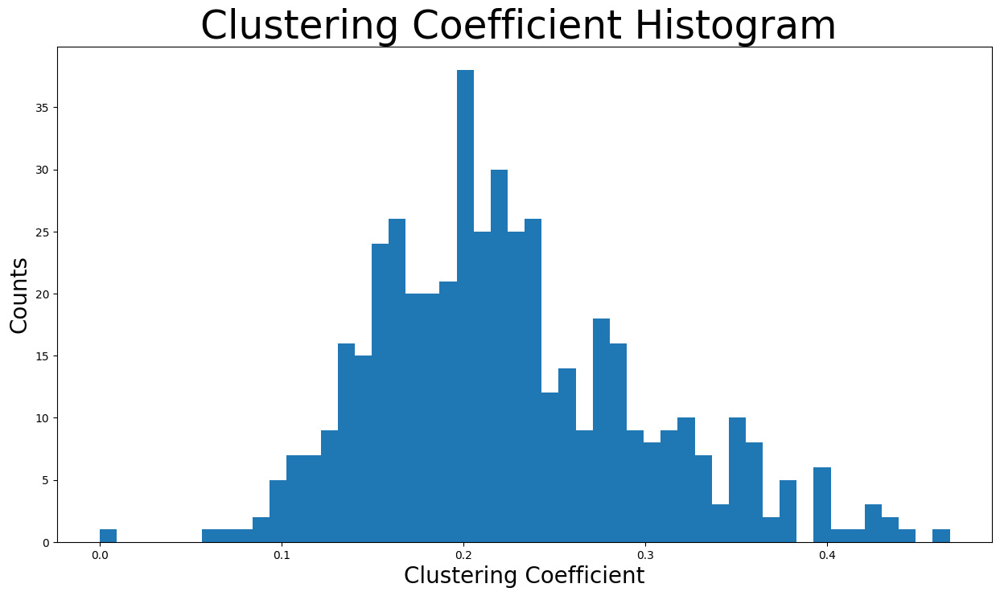

In [84]:
# Display the clustering coefficient distribution

# Set the figure size
plt.figure(figsize=(15, 8))

# Create a histogram of clustering coefficients in the graph
plt.hist(nx.clustering(G).values(), bins=50)

# Set the title for the histogram
plt.title("Clustering Coefficient Histogram ", fontdict={"size": 35}, loc="center")

# Set the label for the x-axis
plt.xlabel("Clustering Coefficient", fontdict={"size": 20})

# Set the label for the y-axis
plt.ylabel("Counts", fontdict={"size": 20})

The bins of clustering coefficient between 0.1 and 0.3 contain the majority of nodes in Graph G.

In [85]:
# Calculate the Clustering Coefficient of the NetworkX graph 'G'
nx.transitivity(G)

0.21166932349342485

In [86]:
# Calculate the Clustering Coefficient of the NetworkX graph 'G_und'
nx.transitivity(G_und)

0.6930459288597761

* A global clustering coefficient of 0.21 indicates a moderate level of local clustering within the network, suggesting some degree of interconnectedness but not a highly clustered topology.
* A global clustering coefficient of 0.693 indicates a high level of local clustering within the network, suggesting a highly clustered or cohesive topology.

The local clustering coefficient of a node in a network is a measure of how much the neighbors of that node are connected to each other.

In [87]:
# Compute the local clustering coefficient for the chosen node
node = 322
local_clustering_coefficient = nx.clustering(G_sub, node)
print(f"Local clustering coefficient for node {node}: {local_clustering_coefficient}")

Local clustering coefficient for node 322: 0.45827048768225237


The **diameter** is the longest of the shortest paths between two nodes of the network.

In [88]:
# Calculate the diameter of the NetworkX graph 'G_und'
nx.diameter(G_und)

3

In order to connect from one node to any other node we would have to traverse 3 edges or fewer.


Finally, the **mean distance**, or **average path lenght** represents the mean of all shortest paths between all nodes. It is a measure of diffusion potential within a network.

In [89]:
# Calculate the average shortest path length in the NetworkX graph 'G_und'
nx.average_shortest_path_length(G_und)

1.6054964539007093

An average path length of 1.6054964539007093 represents the average shortest path between any pair of nodes in the network.
* The average path length provides an indication of the average distance or number of edges that need to be traversed to connect any pair of nodes in the network.
* In this case, a value of approximately 1.61
means that, on average, the shortest path between any two nodes in the network is about 1.61 edges long.
* A short average path length suggests a relatively well-connected or compact network. It signifies that nodes in the network are relatively close to each other and that information or influence can propagate relatively quickly across the network.
* Networks with shorter average path lengths tend to be more efficient for communication or information transfer.

# Data Visualization

Data visualization is a critical aspect of network analysis that aims to represent and interpret intricate network structures, connections, and attributes in a more understandable and insightful manner.

Here we offer multiple visualizations of the graph highlighting different aspects like communities, key nodes, key characteristics etc.

In [90]:
# Create a HoloViews Graph with node colors and community information
G_sub_plot = hv.Graph.from_networkx(G_und, pos).opts(
    tools=['hover'],
    node_color='community',
)

# Create labels for the nodes
labels = hv.Labels(G_sub_plot.nodes, ['x', 'y'], 'username')

# make the plot
from holoviews.operation.datashader import datashade, bundle_graph
bundled = bundle_graph(G_sub_plot)

# Plot the HoloViews Graph
show(hv.render(bundled * labels.opts(
    text_font_size='6pt',
    text_color='black',
)))



The visualizations highlights the 4 different communities and the Twitter users within these. This provide insights into the user index and corresponding username, the degree of the user and the degree centrality, eigenvector centrality and betweeness centrality of the specific user. The visualization also shows the highlighted edges and connections a node has in to other nodes and communites.

In [91]:
# Create a HoloViews Graph with node colors and community information
G_sub_plot = hv.Graph.from_networkx(G_und, pos).opts(
    tools=['hover'],
    node_color='community',
    width=800,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    cmap='viridis',  # Use a colormap for node colors
    node_size=10,  # Set the node size
    edge_line_width=0.2,  # Edge line width
    edge_color='black',  # Edge color
    node_line_color='white',  # Node line color
    node_line_width=1,  # Node line width
)

# Create labels for the nodes
labels = hv.Labels(G_sub_plot.nodes, ['x', 'y'], 'username').opts(
    text_font_size='6pt',
    text_color='black'
)

# make the plot
from holoviews.operation.datashader import datashade, bundle_graph
bundled = bundle_graph(G_sub_plot)

# Plot the HoloViews Graph
show(hv.render(bundled * labels.opts(
    text_font_size='6pt',
    text_color='black',
    width=800,  # Match the width with the Graph
    height=500,  # Match the height with the Graph
)))

In [92]:
# Create a HoloViews Graph with node colors and community information
G_sub_plot = hv.Graph.from_networkx(G_und, pos).opts(
    tools=['hover'],
    node_color='community',
    width=800,  # Adjust the width as needed
    height=500,  # Adjust the height as needed
    cmap='viridis',  # Use a colormap for node colors
    node_size=10,  # Set the node size
    edge_line_width=0.2,  # Edge line width
    edge_color='black',  # Edge color
    node_line_color='white',  # Node line color
    node_line_width=1,  # Node line width
)

# Create labels for the nodes
labels = hv.Labels(G_sub_plot.nodes, ['x', 'y'], 'username').opts(
    text_font_size='6pt',
    text_color='black'
)

# Plot the HoloViews Graph
show(hv.render(G_sub_plot * labels.opts(
    text_font_size='6pt',
    text_color='black',
    width=800,  # Match the width with the Graph
    height=500,  # Match the height with the Graph
)))

# App creation
To create the Streamlit app, we have used `Pyvis` for visualization. It generates an HTML file that is opened in Streamlit. See the code below for generating the `nx.html` file. This `nx.html` file is opened in the app.

In [93]:
# Create a Pyvis Network object
net = Network(
    notebook=True,           # Display the network in a Jupyter Notebook
    cdn_resources="remote",  # Load resources remotely (e.g., JavaScript libraries)
    select_menu=True,        # Enable the node selection menu
    filter_menu=True,        # Enable the node filter menu
)

# Setting the physics options
net.set_options("""
const options = {
  "physics": {
    "minVelocity": 0.75,
    "solver": "repulsion"
  }
}
"""
)

# Define a dictionary to map community values to colors
community_colors = {
    0: '#264653',   # Change to the desired color for community 0
    1: '#2a9d8f',   # Change to the desired color for community 1
    2: '#e9c46a',   # Change to the desired color for community 2
    3: '#f4a261',   # Change to the desired color for community 3
    4: '#e76f51',   # Change to the desired color for community 4
}

# Iterate through the nodes in your NetworkX graph and add them to the Pyvis network
for node_id, node_attrs in G_und.nodes(data=True):
    community = node_attrs.get('community')
    username = node_attrs.get('username', '')  # Get the username, or an empty string if not available
    color = community_colors.get(community, '#264653') if community else '#264653'

    # Add the node to the Pyvis network with color and a custom title containing community and username
    title = f"Community: {community}, Username: {username}"
    net.add_node(node_id, color=color, title=title)

# Iterate through the edges and add them to the Pyvis network
for edge in G_und.edges:
    net.add_edge(edge[0], edge[1])

# Display the network visualization
net.show('nx.html')

nx.html


For the application of the network see streamlit file.

Link to streamlit - Network app https://nfy5subauyku4qnwdlim2f.streamlit.app